**Table of contents**<a id='toc0_'></a>

- [Importing Libraries](#toc1_)
- [Configuring Visualization Parameters](#toc2_)
- [Configuring Other Notebook Parameters](#toc3_)
- [Pre-installing Custom Functions](#toc4_)
- [Downloading Images](#toc5_)
- [Practicing in Stages](#toc6_)
  - [Getting Started with OpenCV 4](#toc6_1_)
    - [Loading Images](#toc6_1_1_)
    - [Displaying Images](#toc6_1_2_)
    - [Saving Images](#toc6_1_3_)
    - [Displaying Image Dimensions](#toc6_1_4_)
  - [Grayscaling Images](#toc6_2_)
    - [Presetting Image Size](#toc6_2_1_)
    - [Grayscale Image Dimensions](#toc6_2_2_)
    - [Displaying Grayscale Image](#toc6_2_3_)
  - [Colour Spaces - RGB and HSV](#toc6_3_)
    - [The RGB Color Space](#toc6_3_1_)
    - [The HSV Color Space](#toc6_3_2_)
  - [Drawing on Images](#toc6_4_)
    - [Creating of Black Canvas](#toc6_4_1_)
    - [Drawing Different Shapes on Black Canvas](#toc6_4_2_)
    - [Adding Text to Image](#toc6_4_3_)
  - [Transformations - Translations and Rotations](#toc6_5_)
    - [Translations](#toc6_5_1_)
    - [Rotations](#toc6_5_2_)
    - [Transpositions](#toc6_5_3_)
    - [Flips](#toc6_5_4_)
  - [Scaling, Re-sizing, Interpolations and Cropping](#toc6_6_)
    - [Scaling and Re-sizing](#toc6_6_1_)
    - [Interpolations](#toc6_6_2_)
    - [Image Pyramids](#toc6_6_3_)
    - [Cropping](#toc6_6_4_)
  - [Arithmetic and Bitwise Operations](#toc6_7_)
    - [Arithmetic Operations](#toc6_7_1_)
    - [Bitwise Operations and Masking](#toc6_7_2_)
  - [Convolutions, Blurring and Sharpening Images](#toc6_8_)
    - [Blurring Using Convolutions](#toc6_8_1_)
    - [Other Commonly Used Blurring Methods in OpenCV](#toc6_8_2_)
    - [Image Denoising - Non-Local Means Denoising](#toc6_8_3_)
    - [Image Sharpening](#toc6_8_4_)

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->


# <a id='toc1_'></a>[Importing Libraries](#toc0_)


In [1]:
# Import OpenCV before using OpenCV functions
import cv2

# Check the version of OpenCV that is running
print(cv2.__version__)

4.8.0


In [2]:
import numpy as np

In [3]:
import matplotlib as mpl
import matplotlib.pyplot as plt

In [4]:
from PIL import Image, ImageDraw, ImageFont

In [5]:
import io
from ipynbcompress import compress
import itertools
import os
import reprlib
import requests
import sys
import time
import zipfile

# <a id='toc2_'></a>[Configuring Visualization Parameters](#toc0_)


In [6]:
%matplotlib inline

In [7]:
XINHUI = "#7a7374"
XUEBAI = "#fffef9"
YINBAI = "#f1f0ed"
YINHUI = "#918072"

figure_size = (16, 9)

In [8]:
custom_params = {
    "axes.axisbelow": True,
    "axes.edgecolor": YINBAI,
    "axes.facecolor": XUEBAI,
    "axes.grid": True,
    "axes.labelcolor": XINHUI,
    "axes.spines.right": False,
    "axes.spines.top": False,
    "axes.titlecolor": XINHUI,
    "figure.edgecolor": YINBAI,
    "figure.facecolor": XUEBAI,
    "grid.alpha": 0.8,
    "grid.color": YINBAI,
    "grid.linestyle": "--",
    "grid.linewidth": 1.2,
    "legend.edgecolor": YINHUI,
    "patch.edgecolor": XUEBAI,
    "patch.force_edgecolor": True,
    "text.color": XINHUI,
    "xtick.color": YINHUI,
    "ytick.color": YINHUI,
}

mpl.rcParams.update(custom_params)

# <a id='toc3_'></a>[Configuring Other Notebook Parameters](#toc0_)


In [9]:
reprlib_rules = reprlib.Repr()
reprlib_rules.maxother = 250

# <a id='toc4_'></a>[Pre-installing Custom Functions](#toc0_)


In [10]:
sys.path.append("../")

In [11]:
from Modules import *

# <a id='toc5_'></a>[Downloading Images](#toc0_)


In [12]:
# Download and unzip the image
if os.path.exists("../Images/") == False:
    request = requests.get(
        "https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip"
    )
    zipdata = zipfile.ZipFile(io.BytesIO(request.content))
    zipinfos = zipdata.infolist()
    for zipinfo in zipinfos:
        infos = list(zipinfo.filename.split("/"))
        if infos[0] != "__MACOSX" and infos[-1] != "":
            zipinfo.filename = infos[-1]
            zipdata.extract(zipinfo, "../Images/")

# <a id='toc6_'></a>[Practicing in Stages](#toc0_)

## <a id='toc6_1_'></a>[Getting Started with OpenCV 4](#toc0_)

### <a id='toc6_1_1_'></a>[Loading Images](#toc0_)


In [13]:
# Load the image using `cv2.imread` specifying the image path
image = cv2.imread("../Images/flowers.jpeg")

tabulation = Form_Generator()
tabulation.heading_printer("Loading images via OpenCV")

statements = ['image = cv2.imread("../Images/flowers.jpeg")']
tabulation.statement_generator(statements)

variables = ["image"]
values = [str(reprlib_rules.repr(image))]
tabulation.variable_generator(variables, values)

expressions = ["image.shape"]
results = [str(image.shape)]
tabulation.expression_generator(expressions, results)

Loading images via OpenCV

    +----------------------------------------------+
    | Statement                                    |
    +----------------------------------------------+
    | image = cv2.imread("../Images/flowers.jpeg") |
    +----------------------------------------------+
    +----------+--------------------------------------+
    | Variable | Value                                |
    +----------+--------------------------------------+
    | image    | array([[[28, 62, 32],                |
    |          |         [28, 62, 32],                |
    |          |         [28, 62, 32],                |
    |          |         ...,                         |
    |          |         [13, 36, 28],                |
    |          |         [11, 34, 26],                |
    |          | ...39, 43],                          |
    |          |         [39, 38, 42],                |
    |          |         ...,                         |
    |          |         [14, 14, 20

### <a id='toc6_1_2_'></a>[Displaying Images](#toc0_)


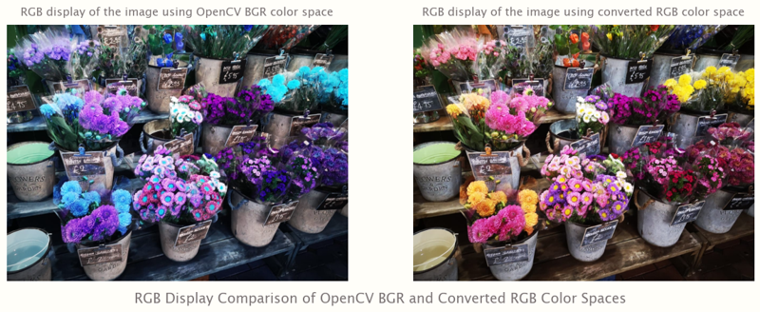

In [14]:
# Display the image using Matplotlib
plt.rcParams["figure.figsize"] = (figure_size[0] / 4 * 3, figure_size[1] / 2)

fig, axs = plt.subplots(nrows=1, ncols=2)

axs[0].imshow(image)
axs[0].set_title(
    "RGB display of the image using OpenCV BGR color space", loc="center", pad=10
)

axs[1].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axs[1].set_title(
    "RGB display of the image using converted RGB color space", loc="center", pad=10
)

for ax in axs.flat:
    ax.grid(False)
    ax.set(xticks=[], yticks=[], frame_on=False)

fig.suptitle(
    "RGB Display Comparison of OpenCV BGR and Converted RGB Color Spaces",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

In [15]:
# Create a simple function to make displaying images simpler and easier
def imshow(title="", image=None):
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)


tabulation = Form_Generator()
tabulation.heading_printer("Definition of image display function")

definitions = [
    """
def imshow(title="", image=None):
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
"""
]
tabulation.definition_generator(definitions)

Definition of image display function

    +--------------------------------------------------------+
    | Definition                                             |
    +--------------------------------------------------------+
    | def imshow(title="", image=None):                      |
    |     plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) |
    |     plt.title(title)                                   |
    +--------------------------------------------------------+


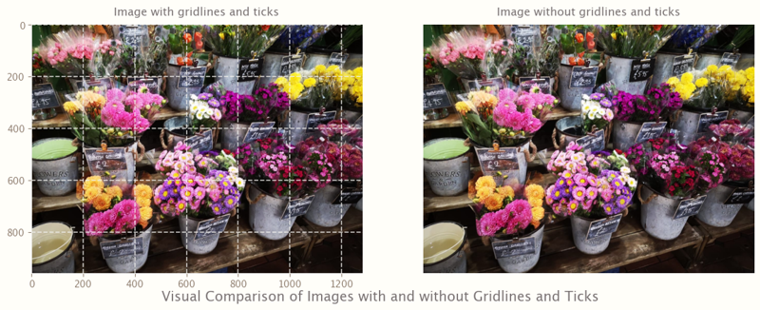

In [16]:
plt.rcParams["figure.figsize"] = (figure_size[0] / 4 * 3, figure_size[1] / 2)

fig, axs = plt.subplots(nrows=1, ncols=2)

plt.subplot(1, 2, 1)
# Test the original display function
imshow("Image with gridlines and ticks", image)

plt.subplot(1, 2, 2)
# Test the display function and remove the grid lines and ticks
imshow("Image without gridlines and ticks", image)

for ax in axs.flat:
    ax.set_title(ax.get_title(), loc="center", pad=10)

axs[1].grid(False)
axs[1].set(xticks=[], yticks=[], frame_on=False)

fig.suptitle(
    "Visual Comparison of Images with and without Gridlines and Ticks",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc6_1_3_'></a>[Saving Images](#toc0_)


In [17]:
# Simply use `cv2.imwrite` to specify the filename and image to save
cv2.imwrite("../Images/output_jpg.jpg", image)

# Save the image as PNG (Portable Network Graphics), which is a lossless bitmap image format
cv2.imwrite("../Images/output_png.png", image)

tabulation = Form_Generator()
tabulation.heading_printer("Saving images via OpenCV")

statements = [
    """
cv2.imwrite("../Images/output_jpg.jpg", image)

cv2.imwrite("../Images/output_png.png", image)
"""
]
tabulation.statement_generator(statements)

Saving images via OpenCV

    +------------------------------------------------+
    | Statement                                      |
    +------------------------------------------------+
    | cv2.imwrite("../Images/output_jpg.jpg", image) |
    |                                                |
    | cv2.imwrite("../Images/output_png.png", image) |
    +------------------------------------------------+


### <a id='toc6_1_4_'></a>[Displaying Image Dimensions](#toc0_)


In [18]:
tabulation = Form_Generator()
tabulation.heading_printer("Displaying image dimensions")

# To access a dimension, simply index it with 0, 1, or 2
expressions = ["image.shape[0]", "image.shape[1]", "image.shape[2]"]
results = [
    str(image.shape[0]),
    str(image.shape[1]),
    str(image.shape[2]),
]
tabulation.expression_generator(expressions, results)


dataframe = DataFrame_Generator("dimension", "unit", index=["height", "width", "depth"])
dataframe.updater(str(image.shape[0]), "pixel")
dataframe.updater(str(image.shape[1]), "pixel")
dataframe.updater(str(image.shape[2]), "color component")

df_table = dataframe.tabulation()
tabulation.dataframe_generator(df_table)

Displaying image dimensions

    +----------------+--------+
    | Expression     | Result |
    +----------------+--------+
    | image.shape[0] | 960    |
    | image.shape[1] | 1280   |
    | image.shape[2] | 3      |
    +----------------+--------+
    +--------+-------------+-----------------+
    |        |   dimension | unit            |
    |--------+-------------+-----------------|
    | height |         960 | pixel           |
    | width  |        1280 | pixel           |
    | depth  |           3 | color component |
    +--------+-------------+-----------------+


## <a id='toc6_2_'></a>[Grayscaling Images](#toc0_)

### <a id='toc6_2_1_'></a>[Presetting Image Size](#toc0_)


In [19]:
# Define new `cv2.imshow` function to preset image size
def imshow(title="Image", image=None, size=5):
    h, w = image.shape[0], image.shape[1]
    aspect_ratio = w / h
    plt.figure(figsize=(size * aspect_ratio, size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)

    plt.box(False)
    plt.grid(False)
    plt.axis("off")

    plt.show()


tabulation = Form_Generator()
tabulation.heading_printer("Definition of size preset image display function")

definitions = [
    """
def imshow(title="Image", image=None, size=5):
    h, w = image.shape[0], image.shape[1]
    aspect_ratio = w / h
    plt.figure(figsize=(size * aspect_ratio, size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)

    plt.box(False)
    plt.grid(False)
    plt.axis("off")

    plt.show()
"""
]
tabulation.definition_generator(definitions)

Definition of size preset image display function

    +--------------------------------------------------------+
    | Definition                                             |
    +--------------------------------------------------------+
    | def imshow(title="Image", image=None, size=5):         |
    |     h, w = image.shape[0], image.shape[1]              |
    |     aspect_ratio = w / h                               |
    |     plt.figure(figsize=(size * aspect_ratio, size))    |
    |     plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) |
    |     plt.title(title)                                   |
    |                                                        |
    |     plt.box(False)                                     |
    |     plt.grid(False)                                    |
    |     plt.axis("off")                                    |
    |                                                        |
    |     plt.show()                                         |
    +

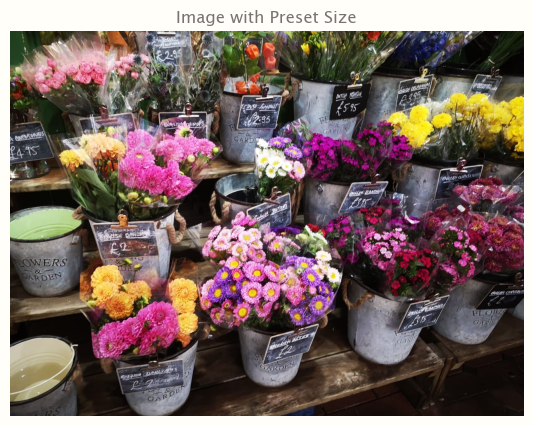

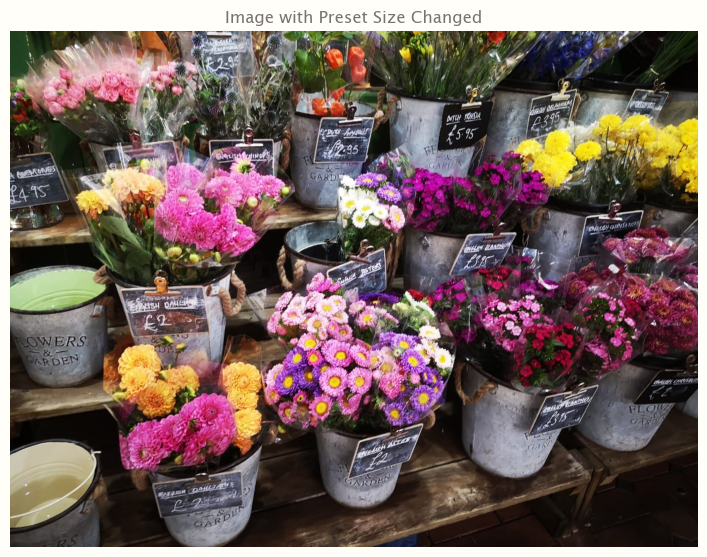

In [20]:
# Reload the image using the new function
imshow("Image with Preset Size", image)

# Reload the image using the new function with the parameter `size`
imshow("Image with Preset Size Changed", image, size=6.7)

### <a id='toc6_2_2_'></a>[Grayscale Image Dimensions](#toc0_)


In [21]:
# Convert the original image to grayscale using `cv2.cvtColor`
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

tabulation = Form_Generator()
tabulation.heading_printer("Conversion of original image to grayscale image")

statements = ["gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)"]
tabulation.statement_generator(statements)

variables = ["gray_image"]
values = [str(reprlib_rules.repr(gray_image))]
tabulation.variable_generator(variables, values)

expressions = ["gray_image.shape", "image.shape[0]", "image.shape[1]"]
results = [
    str(gray_image.shape),
    str(image.shape[0]),
    str(image.shape[1]),
]
tabulation.expression_generator(expressions, results)

Conversion of original image to grayscale image

    +------------------------------------------------------+
    | Statement                                            |
    +------------------------------------------------------+
    | gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) |
    +------------------------------------------------------+
    +------------+------------------------------------------------+
    | Variable   | Value                                          |
    +------------+------------------------------------------------+
    | gray_image | array([[49, 49, 49, ..., 31, 29, 26],          |
    |            |        [49, 49, 49, ..., 29, 27, 25],          |
    |            |        [49, 49, 49, ..., 27, 27, 25],          |
    |            |        .....    [40, 40, 39, ..., 16, 16, 16], |
    |            |        [40, 40, 39, ..., 16, 16, 16],          |
    |            |        [40, 40, 39, ..., 16, 16, 16]],         |
    |            |         dtype=u

### <a id='toc6_2_3_'></a>[Displaying Grayscale Image](#toc0_)


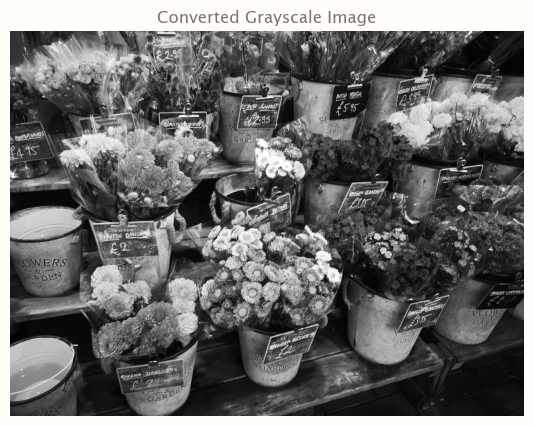

In [22]:
# Reload the grayscale image
imshow("Converted Grayscale Image", gray_image)

## <a id='toc6_3_'></a>[Colour Spaces - RGB and HSV](#toc0_)

### <a id='toc6_3_1_'></a>[The RGB Color Space](#toc0_)


In [23]:
# Use `cv2.split` to get each color channel separately
B, G, R = cv2.split(image)

tabulation = Form_Generator()
tabulation.heading_printer("Splitting channels")

statements = ["B, G, R = cv2.split(image)"]
tabulation.statement_generator(statements)

variables = ["B", "G", "R"]
values = [
    str(reprlib_rules.repr(B)),
    str(reprlib_rules.repr(G)),
    str(reprlib_rules.repr(R)),
]
tabulation.variable_generator(variables, values)

expressions = ["B.shape", "G.shape", "R.shape"]
results = [str(B.shape), str(G.shape), str(R.shape)]
tabulation.expression_generator(expressions, results)

Splitting channels

    +----------------------------+
    | Statement                  |
    +----------------------------+
    | B, G, R = cv2.split(image) |
    +----------------------------+
    +----------+------------------------------------------------+
    | Variable | Value                                          |
    +----------+------------------------------------------------+
    | B        | array([[28, 28, 28, ..., 13, 11,  8],          |
    |          |        [28, 28, 28, ..., 11,  9,  7],          |
    |          |        [28, 28, 28, ...,  9,  9,  7],          |
    |          |        .....    [40, 40, 39, ..., 14, 14, 14], |
    |          |        [40, 40, 39, ..., 14, 14, 14],          |
    |          |        [40, 40, 39, ..., 14, 14, 14]],         |
    |          |         dtype=uint8)                           |
    | G        | array([[62, 62, 62, ..., 36, 34, 31],          |
    |          |        [62, 62, 62, ..., 34, 32, 30],          |
    |        

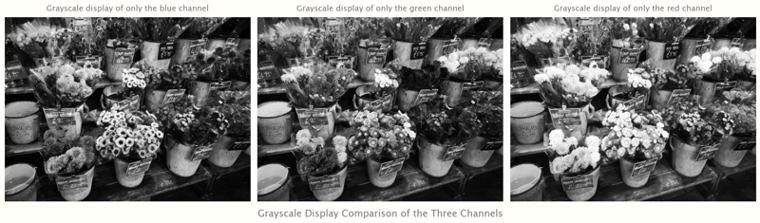

In [24]:
def imshow_subplot(title="", image=None, conversion=cv2.COLOR_BGR2RGB, axis="off"):
    plt.imshow(cv2.cvtColor(image, conversion))
    plt.title(title, loc="center", pad=10)

    plt.box(False)
    plt.grid(False)
    plt.axis(axis)


plt.rcParams["figure.figsize"] = (figure_size[0], figure_size[1] / 2)

fig, axs = plt.subplots(nrows=1, ncols=3)

plt.subplot(1, 3, 1)
# Note that the color channel alone looks like grayscale, because it lacks the
# other color channels
imshow_subplot("Grayscale display of only the blue channel", B)

plt.subplot(1, 3, 2)
imshow_subplot("Grayscale display of only the green channel", G)

plt.subplot(1, 3, 3)
imshow_subplot("Grayscale display of only the red channel", R)


fig.suptitle(
    "Grayscale Display Comparison of the Three Channels",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

In [25]:
# Create a matrix of zeros with image height and width dimensions
zeros = np.zeros(image.shape[:2], dtype="uint8")

tabulation = Form_Generator()
tabulation.heading_printer("Creating a matrix of zeros")

statements = ['zeros = np.zeros(image.shape[:2], dtype="uint8")']
tabulation.statement_generator(statements)

variables = ["zeros"]
values = [
    str(reprlib_rules.repr(zeros)),
]
tabulation.variable_generator(variables, values)

expressions = ["zeros.shape"]
results = [str(zeros.shape)]
tabulation.expression_generator(expressions, results)

Creating a matrix of zeros

    +--------------------------------------------------+
    | Statement                                        |
    +--------------------------------------------------+
    | zeros = np.zeros(image.shape[:2], dtype="uint8") |
    +--------------------------------------------------+
    +----------+-----------------------------------------------+
    | Variable | Value                                         |
    +----------+-----------------------------------------------+
    | zeros    | array([[0, 0, 0, ..., 0, 0, 0],               |
    |          |        [0, 0, 0, ..., 0, 0, 0],               |
    |          |        [0, 0, 0, ..., 0, 0, 0],               |
    |          |        ...,                                   |
    |          |        [0, 0, 0, ..., 0, 0, 0],               |
    |          |        [0, 0, 0, ..., 0, 0, 0],               |
    |          |        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8) |
    +----------+---------------------

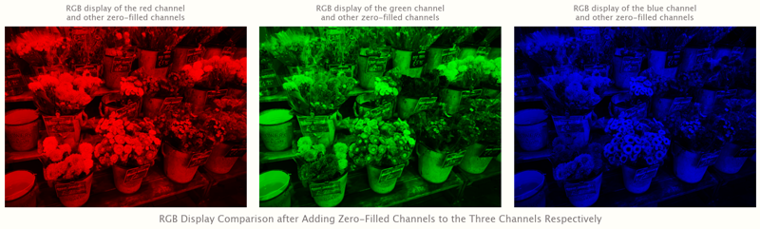

In [26]:
plt.rcParams["figure.figsize"] = (figure_size[0], figure_size[1] / 2)

fig, axs = plt.subplots(nrows=1, ncols=3)

plt.subplot(1, 3, 1)
# Use `cv2.merge` to merge several single-channel images into a multi-channel image
imshow_subplot(
    "RGB display of the red channel\nand other zero-filled channels",
    cv2.merge([zeros, zeros, R]),
)

plt.subplot(1, 3, 2)
imshow_subplot(
    "RGB display of the green channel\nand other zero-filled channels",
    cv2.merge([zeros, G, zeros]),
)

plt.subplot(1, 3, 3)
imshow_subplot(
    "RGB display of the blue channel\nand other zero-filled channels",
    cv2.merge([B, zeros, zeros]),
)


fig.suptitle(
    "RGB Display Comparison after Adding Zero-Filled Channels to the Three Channels Respectively",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

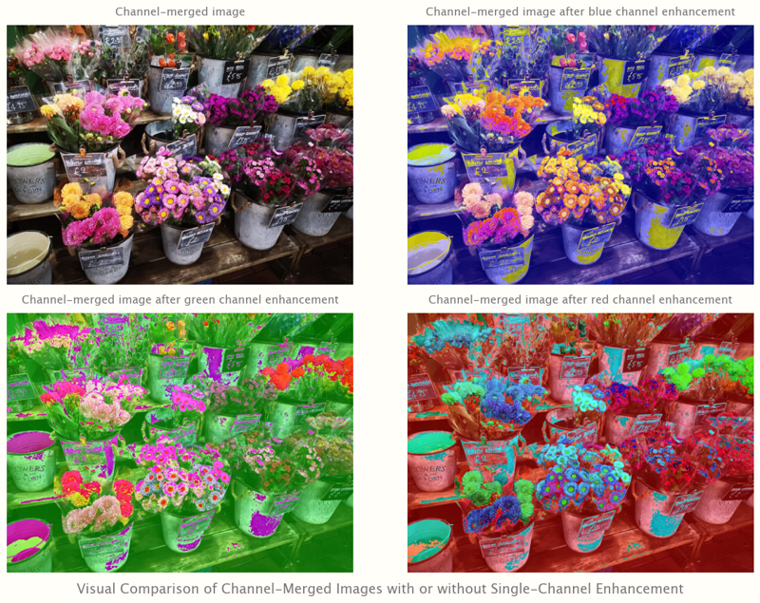

In [27]:
plt.rcParams["figure.figsize"] = (figure_size[0] / 4 * 3, figure_size[1])

fig, axs = plt.subplots(nrows=2, ncols=2)

plt.subplot(2, 2, 1)
# The original image can be merged according to the correct channel order
merged = cv2.merge([B, G, R])
imshow_subplot("Channel-merged image", merged)

plt.subplot(2, 2, 2)
# The channel weights of the merged image can be adjusted by changing the value of each channel
merged = cv2.merge([B + 100, G, R])
imshow_subplot("Channel-merged image after blue channel enhancement", merged)

plt.subplot(2, 2, 3)
merged = cv2.merge([B, G + 100, R])
imshow_subplot("Channel-merged image after green channel enhancement", merged)

plt.subplot(2, 2, 4)
merged = cv2.merge([B, G, R + 100])
imshow_subplot("Channel-merged image after red channel enhancement", merged)


fig.suptitle(
    "Visual Comparison of Channel-Merged Images with or without Single-Channel Enhancement",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc6_3_2_'></a>[The HSV Color Space](#toc0_)


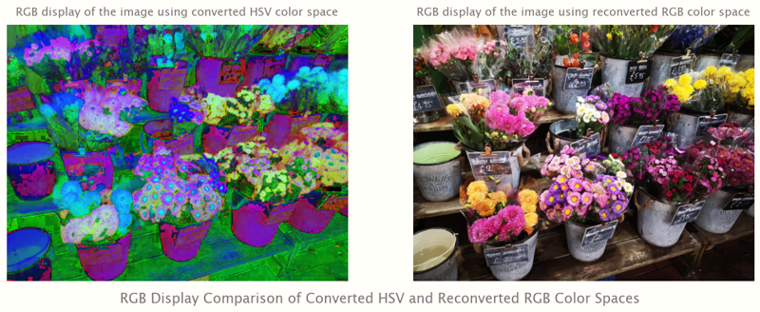

In [28]:
plt.rcParams["figure.figsize"] = (figure_size[0] / 4 * 3, figure_size[1] / 2)

fig, axs = plt.subplots(nrows=1, ncols=2)

plt.subplot(1, 2, 1)
# Use `cv2.COLOR_BGR2HSV` to convert an image from BGR color space to HSV color space
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
imshow_subplot(
    "RGB display of the image using converted HSV color space",
    hsv_image,
    conversion=None,
)

plt.subplot(1, 2, 2)
# Use `cv2.COLOR_HSV2RGB` to convert an image from HSV color space to RGB color space
imshow_subplot(
    "RGB display of the image using reconverted RGB color space",
    cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB),
    conversion=None,
)

fig.suptitle(
    "RGB Display Comparison of Converted HSV and Reconverted RGB Color Spaces",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

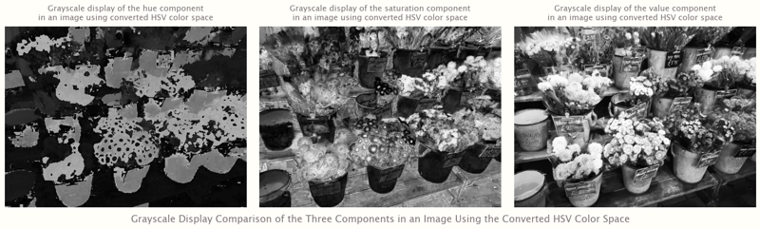

In [29]:
plt.rcParams["figure.figsize"] = (figure_size[0], figure_size[1] / 2)

fig, axs = plt.subplots(nrows=1, ncols=3)

plt.subplot(1, 3, 1)
# To access a component of any color space, index it with 0, 1, or 2 on the depth dimension
imshow_subplot(
    "Grayscale display of the hue component\nin an image using converted HSV color space",
    hsv_image[:, :, 0],
)

plt.subplot(1, 3, 2)
imshow_subplot(
    "Grayscale display of the saturation component\nin an image using converted HSV color space",
    hsv_image[:, :, 1],
)

plt.subplot(1, 3, 3)
imshow_subplot(
    "Grayscale display of the value component\nin an image using converted HSV color space",
    hsv_image[:, :, 2],
)

fig.suptitle(
    "Grayscale Display Comparison of the Three Components in an Image Using the Converted HSV Color Space",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

## <a id='toc6_4_'></a>[Drawing on Images](#toc0_)

### <a id='toc6_4_1_'></a>[Creating of Black Canvas](#toc0_)


In [30]:
# Create a black canvas by creating a black 3D array with numpy
image = np.zeros((512, 512, 3), np.uint8)

# Create a grayscale black canvas by creating a blank 2D array with numpy
image_gray = np.zeros((512, 512), np.uint8)

tabulation = Form_Generator()
tabulation.heading_printer("Image creation via numpy")

statements = [
    """
image = np.zeros((512, 512, 3), np.uint8)

image_gray = np.zeros((512, 512), np.uint8)
"""
]
tabulation.statement_generator(statements)

variables = ["image", "image_gray"]
values = [
    str(reprlib_rules.repr(image)),
    str(reprlib_rules.repr(image_gray)),
]
tabulation.variable_generator(variables, values)

expressions = ["image.shape", "image_gray.shape"]
results = [str(image.shape), str(image_gray.shape)]
tabulation.expression_generator(expressions, results)

Image creation via numpy

    +---------------------------------------------+
    | Statement                                   |
    +---------------------------------------------+
    | image = np.zeros((512, 512, 3), np.uint8)   |
    |                                             |
    | image_gray = np.zeros((512, 512), np.uint8) |
    +---------------------------------------------+
    +------------+-----------------------------------------------+
    | Variable   | Value                                         |
    +------------+-----------------------------------------------+
    | image      | array([[[0, 0, 0],                            |
    |            |         [0, 0, 0],                            |
    |            |         [0, 0, 0],                            |
    |            |         ...,                                  |
    |            |         [0, 0, 0],                            |
    |            |         [0, 0, 0],                            |
    |  

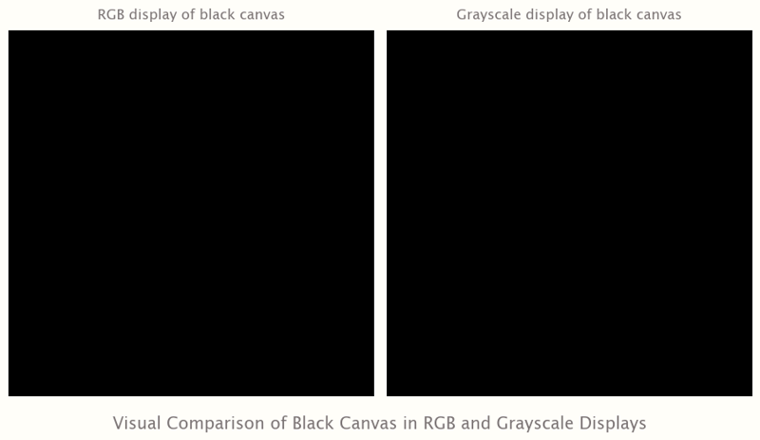

In [31]:
plt.rcParams["figure.figsize"] = (figure_size[0] / 7 * 4, figure_size[1] / 7 * 4)

fig, axs = plt.subplots(nrows=1, ncols=2)

plt.subplot(1, 2, 1)
# Note that black looks the same as black in grayscale or RGB displays
imshow_subplot("RGB display of black canvas", image)

plt.subplot(1, 2, 2)
imshow_subplot("Grayscale display of black canvas", image_gray)

fig.suptitle(
    "Visual Comparison of Black Canvas in RGB and Grayscale Displays",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc6_4_2_'></a>[Drawing Different Shapes on Black Canvas](#toc0_)


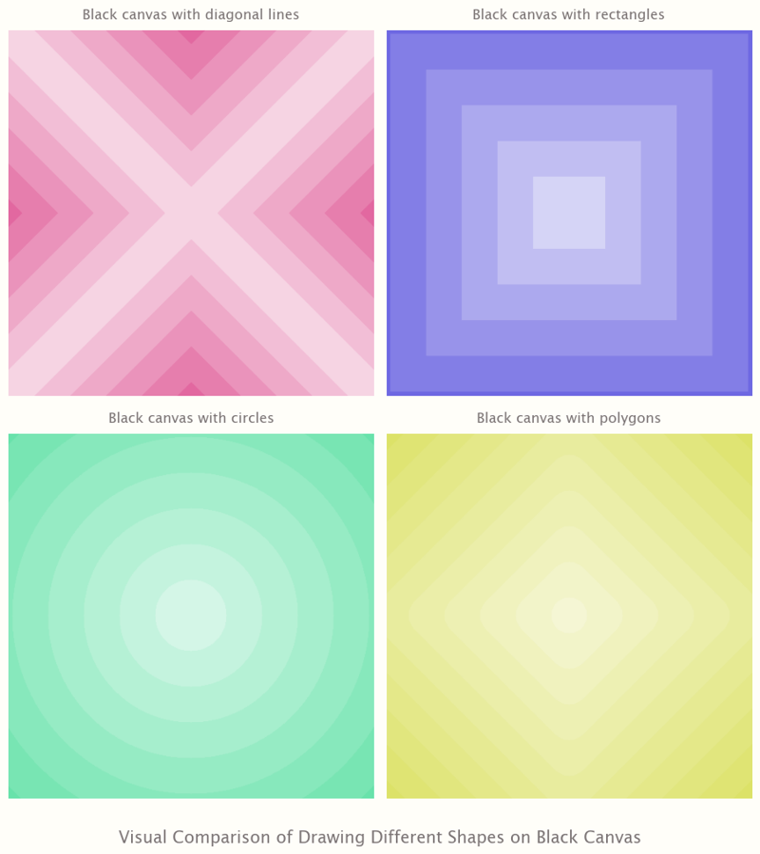

In [32]:
colors = calm_color_generator(4)

x1 = y1 = 0
x2 = y2 = 511
x_medium = (x1 + x2) // 2
y_medium = (y1 + y2) // 2
interval = 100
interval_medium = interval // 2
divisor = 2.0

plt.rcParams["figure.figsize"] = (figure_size[0] / 7 * 4, figure_size[1] / 7 * 8)

fig, axs = plt.subplots(nrows=2, ncols=2)

plt.subplot(2, 2, 1)
# Create a black canvas to draw lines on
image = np.zeros((512, 512, 3), np.uint8)
gradient_colors = gradient_dark_generator(colors[0], 6)
# Note that this is an in-place operation, meaning it changes the input image, unlike many
# other OpenCV functions that return a new image without affecting the input
for i in range(5, 0, -1):
    cv2.line(
        image,
        (x1 + i * interval // 2, y1),
        (x2, y2 - i * interval // 2),
        hex_to_rgb(gradient_colors[i]),
        int(interval / divisor),
    )
    cv2.line(
        image,
        (x1 + i * interval // 2, y2),
        (x2, y1 + i * interval // 2),
        hex_to_rgb(gradient_colors[i]),
        int(interval / divisor),
    )
    cv2.line(
        image,
        (x1, y1 + i * interval // 2),
        (x2 - i * interval // 2, y2),
        hex_to_rgb(gradient_colors[i]),
        int(interval / divisor),
    )
    cv2.line(
        image,
        (x1, y2 - i * interval // 2),
        (x2 - i * interval // 2, y1),
        hex_to_rgb(gradient_colors[i]),
        int(interval / divisor),
    )
cv2.line(
    image, (x1, y1), (x2, y2), hex_to_rgb(gradient_colors[0]), int(interval / divisor)
)
cv2.line(
    image, (x1, y2), (x2, y1), hex_to_rgb(gradient_colors[0]), int(interval / divisor)
)
imshow_subplot("Black canvas with diagonal lines", image)

plt.subplot(2, 2, 2)
# Create another black canvas again, since now the previous canvas has been drawn with lines
image = np.zeros((512, 512, 3), np.uint8)
gradient_colors = gradient_dark_generator(colors[1], 6)
for i in range(6, 0, -1):
    # When the `thickness` value is equal to -1, it means that this shape is filled with color
    cv2.rectangle(
        image,
        (x_medium - interval_medium * i, y_medium - interval_medium * i),
        (x_medium + interval_medium * i, y_medium + interval_medium * i),
        hex_to_rgb(gradient_colors[i - 1]),
        thickness=-1,
    )
imshow_subplot("Black canvas with rectangles", image)

plt.subplot(2, 2, 3)
image = np.zeros((512, 512, 3), np.uint8)
gradient_colors = gradient_dark_generator(colors[2], 8)
for i in range(8, 0, -1):
    cv2.circle(
        image,
        (x_medium, y_medium),
        interval_medium * i,
        hex_to_rgb(gradient_colors[i - 1]),
        thickness=-1,
    )
imshow_subplot("Black canvas with circles", image)

plt.subplot(2, 2, 4)
image = np.zeros((512, 512, 3), np.uint8)
gradient_colors = gradient_dark_generator(colors[3], 11)
for i in range(10, -1, -1):
    # Before drawing a polygon, each point of the polygon should be defined
    points = np.array(
        [
            [x_medium, y_medium + interval_medium * i],
            [x_medium + interval_medium * i, y_medium],
            [x_medium, y_medium - interval_medium * i],
            [x_medium - interval_medium * i, y_medium],
        ],
        np.int32,
    )
    # Need to reshape the previously defined points in the form required by `cv2.polylines`
    points = points.reshape((-1, 1, 2))
    cv2.polylines(
        image, [points], True, hex_to_rgb(gradient_colors[i]), int(interval / divisor)
    )
imshow_subplot("Black canvas with polygons", image)

fig.suptitle(
    "Visual Comparison of Drawing Different Shapes on Black Canvas",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

In [33]:
# Combined coordinates of polygon corners
pts = np.array([[10, 50], [400, 50], [90, 200], [50, 500]], np.int32)

new_pts = pts.reshape((-1, 1, 2))

tabulation = Form_Generator()
tabulation.heading_printer(
    "Structural reshaping of combined coordinates of polygon corners"
)

statements = [
    """
pts = np.array([[10, 50], [400, 50], [90, 200], [50, 500]], np.int32)

new_pts = pts.reshape((-1, 1, 2))
"""
]
tabulation.statement_generator(statements)

variables = ["pts", "new_pts"]
values = [str(pts), str(new_pts)]
tabulation.variable_generator(variables, values)

expressions = ["pts.shape", "new_pts.shape"]
results = [str(pts.shape), str(new_pts.shape)]
tabulation.expression_generator(expressions, results)

Structural reshaping of combined coordinates of polygon corners

    +-------------------------------------------------------------+
    | Statement                                                   |
    +-------------------------------------------------------------+
    | pts = np.array([[10, 50], [400, 50], [90, 200], [50, 500]], |
    |     np.int32)                                               |
    |                                                             |
    | new_pts = pts.reshape((-1, 1, 2))                           |
    +-------------------------------------------------------------+
    +----------+---------------+
    | Variable | Value         |
    +----------+---------------+
    | pts      | [[ 10  50]    |
    |          |  [400  50]    |
    |          |  [ 90 200]    |
    |          |  [ 50 500]]   |
    | new_pts  | [[[ 10  50]]  |
    |          |               |
    |          |  [[400  50]]  |
    |          |               |
    |          |  [[ 90 200]

### <a id='toc6_4_3_'></a>[Adding Text to Image](#toc0_)


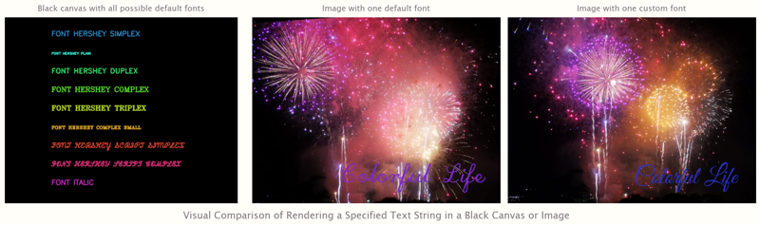

In [34]:
# In OpenCV, only a subset of Hershey fonts are supported
opencv_font_dict = {
    cv2.FONT_HERSHEY_SIMPLEX: "FONT HERSHEY SIMPLEX",
    cv2.FONT_HERSHEY_PLAIN: "FONT HERSHEY PLAIN",
    cv2.FONT_HERSHEY_DUPLEX: "FONT HERSHEY DUPLEX",
    cv2.FONT_HERSHEY_COMPLEX: "FONT HERSHEY COMPLEX",
    cv2.FONT_HERSHEY_TRIPLEX: "FONT HERSHEY TRIPLEX",
    cv2.FONT_HERSHEY_COMPLEX_SMALL: "FONT HERSHEY COMPLEX SMALL",
    cv2.FONT_HERSHEY_SCRIPT_SIMPLEX: "FONT HERSHEY SCRIPT SIMPLEX",
    cv2.FONT_HERSHEY_SCRIPT_COMPLEX: "FONT HERSHEY SCRIPT COMPLEX",
    cv2.FONT_ITALIC: "FONT ITALIC",
}

black_canva = np.zeros((1000, 1250 * image.shape[1] // image.shape[0], 3), np.uint8)
text = "Colorful Life"

colors = calm_color_generator(len(opencv_font_dict) + 2)

plt.rcParams["figure.figsize"] = (figure_size[0], figure_size[1] / 2)

fig, axs = plt.subplots(nrows=1, ncols=3)

plt.subplot(1, 3, 1)
for i, key, value in zip(
    range(len(opencv_font_dict)), opencv_font_dict.keys(), opencv_font_dict.values()
):
    cv2.putText(
        black_canva,
        value,
        (250, 100 + i * 100),
        key,
        1.25,
        hex_to_rgb(colors.pop(0)),
        3,
    )
imshow_subplot("Black canvas with all possible default fonts", black_canva)

plt.subplot(1, 3, 2)
# Load new input image
image = cv2.imread("../Images/fireworks.jpeg")
cv2.putText(
    image,
    text,
    (450, 850),
    cv2.FONT_HERSHEY_SCRIPT_COMPLEX,
    4.5,
    hex_to_rgb(colors.pop(0)),
    3,
)
imshow_subplot("Image with one default font", image)

plt.subplot(1, 3, 3)
# Load new input image
image = cv2.imread("../Images/fireworks2.jpeg")
fontpath = "../Fonts/Great_Vibes/GreatVibes-Regular.ttf"
font = ImageFont.truetype(fontpath, 125)

# It is possible to pass an OpenCV image to PIL, have PIL draw text on it, and then
# return the image to OpenCV
image_pil = Image.fromarray(image)
draw = ImageDraw.Draw(image_pil)
draw.text((650, 750), text, font=font, fill=hex_to_rgb(colors.pop(0)))
image = np.array(image_pil)
imshow_subplot("Image with one custom font", image)

fig.suptitle(
    "Visual Comparison of Rendering a Specified Text String in a Black Canvas or Image",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

## <a id='toc6_5_'></a>[Transformations - Translations and Rotations](#toc0_)

### <a id='toc6_5_1_'></a>[Translations](#toc0_)


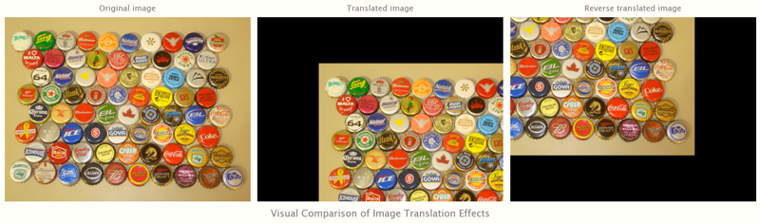

In [35]:
# Load new input image
image = cv2.imread("../Images/bottlecaps.jpg")

# Store height and width of the image
height, width = image.shape[:2]

plt.rcParams["figure.figsize"] = (figure_size[0], figure_size[1] / 2)

fig, axs = plt.subplots(nrows=1, ncols=3)

plt.subplot(1, 3, 1)
imshow_subplot("Original image", image)

plt.subplot(1, 3, 2)
# Set a quarter of the width and height as the translation distance
quarter_width, quarter_height = width / 4, height / 4

# Create a translation matrix to translate the image by a quarter of its width and height

# Translation is simply the movement of an object's position

# Suppose a point P(x,y) is translated by (tx, ty), then the translated coordinates P'(x',y')
# can be calculated as follows

# As mentioned before, x' = x + Tx, y' = y + Ty, can be expressed in matrix form as:
# A = | 1 0 |, B = | Tx |, | x' | = A * | x | + B = | 1, 0, Tx | * | x |
#     | 0 1 |      | Ty |  | y' |       | y |       | 0, 1, Ty |   | y |
#                                                                  | 1 |

# Therefore, the translation matrix (T) should be: | 1, 0, Tx |
#                                                  | 0, 1, Ty |
T = np.float32([[1, 0, quarter_width], [0, 1, quarter_height]])

# Use `cv2.warpAffine` to transform an image using matrix (T)
image_translation = cv2.warpAffine(image, T, (width, height))
imshow_subplot("Translated image", image_translation)

plt.subplot(1, 3, 3)
# If the translation distance is set to a negative number, the matrix will translate
# in the opposite direction
T = np.float32([[1, 0, -quarter_width], [0, 1, -quarter_height]])
image_translation = cv2.warpAffine(image, T, (width, height))
imshow_subplot("Reverse translated image", image_translation)

fig.suptitle(
    "Visual Comparison of Image Translation Effects",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

In [36]:
height, width = image.shape[:2]

quarter_width, quarter_height = width / 4, height / 4

T = np.float32([[1, 0, quarter_width], [0, 1, quarter_height]])

tabulation = Form_Generator()
tabulation.heading_printer("View of the translation matrix (T)")

statements = [
    """
height, width = image.shape[:2]

quarter_width, quarter_height = width / 4, height / 4

T = np.float32([[1, 0, quarter_width], [0, 1, quarter_height]])
"""
]
tabulation.statement_generator(statements)

# Show what the translation matrix (T) looks like
variables = ["width", "height", "quarter_width", "quarter_height", "T"]
values = [str(width), str(height), str(quarter_width), str(quarter_height), str(T)]
tabulation.variable_generator(variables, values)

expressions = ["T.shape"]
results = [str(T.shape)]
tabulation.expression_generator(expressions, results)

View of the translation matrix (T)

    +-------------------------------------------------------+
    | Statement                                             |
    +-------------------------------------------------------+
    | height, width = image.shape[:2]                       |
    |                                                       |
    | quarter_width, quarter_height = width / 4, height / 4 |
    |                                                       |
    | T = np.float32([[1, 0, quarter_width], [0, 1,         |
    |     quarter_height]])                                 |
    +-------------------------------------------------------+
    +----------------+--------------------+
    | Variable       | Value              |
    +----------------+--------------------+
    | width          | 1024               |
    | height         | 768                |
    | quarter_width  | 256.0              |
    | quarter_height | 192.0              |
    | T              | [[  1.   0. 2

### <a id='toc6_5_2_'></a>[Rotations](#toc0_)


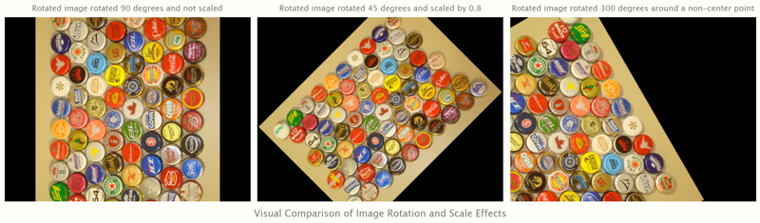

In [37]:
plt.rcParams["figure.figsize"] = (figure_size[0], figure_size[1] / 2)

fig, axs = plt.subplots(nrows=1, ncols=3)

plt.subplot(1, 3, 1)
# Rotate the image around its center by dividing the length and width by two

# Suppose there is a point P(x, y) at an angle alpha (a) from an adjustable center of
# rotation O(x0, y0) at a distance r

# Now rotate point P clockwise around rotation center O by angle theta (b)

# Rotational coordinates can be obtained in the following ways

# As mentioned before, for point P, x = x0 + r * cos(a), y = y0 + r * sin(a)

# Therefore, for point P',
# x' = x0 + r * cos(a + b)
#    = x0 + r * cos(a) * cos(b) - r * sin(a) * sin(b)
#    = x0 + (x - x0) * cos(b) - (y - y0) * sin(b)
#    = x * cos(b) - y * sin(b) + x0 * (1 - cos(b)) + y0 * sin(b),
# y' = y0 + r * sin(a + b)
#    = y0 + r * sin(a) * cos(b) + r * cos(a) * sin(b)
#    = y0 + (y - y0) * cos(b) + (x - x0) * sin(b)
#    = x * sin(b) + y * cos(b)  + y0 * (1 - cos(b)) - x0 * sin(b)

# Similarly, can be expressed in matrix form as:
# | x' | = | cos(b), -sin(b), x0 * (1 - cos(b)) + y0 * sin(b) | * | x |
# | y' |   | sin(b),  cos(b), y0 * (1 - cos(b)) - x0 * sin(b) |   | y |
#                                                                 | 1 |

# Thus, the rotation matrix should be: | cos(b), -sin(b), x0 * (1 - cos(b)) + y0 * sin(b) |
#                                      | sin(b),  cos(b), y0 * (1 - cos(b)) - x0 * sin(b) |
rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), 90, 1)

# Define the rotation matrix and desired final width and height here
rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
imshow_subplot("Rotated image rotated 90 degrees and not scaled", rotated_image)

plt.subplot(1, 3, 2)
# Set the image scale to 0.8
rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), 45, 0.8)
rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
imshow_subplot("Rotated image rotated 45 degrees and scaled by 0.8", rotated_image)

plt.subplot(1, 3, 3)
# Rotate the image around a non-center point
rotation_matrix = cv2.getRotationMatrix2D((quarter_width, quarter_height), -60, 1)
rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
imshow_subplot(
    "Rotated image rotated 300 degrees around a non-center point", rotated_image
)

fig.suptitle(
    "Visual Comparison of Image Rotation and Scale Effects",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

In [38]:
rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), 90, 1)

tabulation = Form_Generator()
tabulation.heading_printer("View of the rotation matrix")

statements = [
    """
rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), 90, 1)
"""
]
tabulation.statement_generator(statements)

# Show what the rotation matrix looks like
variables = ["rotation_matrix"]
values = [str(rotation_matrix)]
tabulation.variable_generator(variables, values, 3)

expressions = ["rotation_matrix.shape"]
results = [str(rotation_matrix.shape)]
tabulation.expression_generator(expressions, results)

View of the rotation matrix

    +-------------------------------------------------------+
    | Statement                                             |
    +-------------------------------------------------------+
    | rotation_matrix = cv2.getRotationMatrix2D((width / 2, |
    |     height / 2), 90, 1)                               |
    +-------------------------------------------------------+
    +-----------------+--------------------------------+
    | Variable        | Value                          |
    +-----------------+--------------------------------+
    | rotation_matrix | [[ 6.123234e-17  1.000000e+00  |
    |                 |    1.280000e+02]               |
    |                 |  [-1.000000e+00  6.123234e-17  |
    |                 |    8.960000e+02]]              |
    +-----------------+--------------------------------+
    +-----------------------+--------+
    | Expression            | Result |
    +-----------------------+--------+
    | rotation_matrix.shap

### <a id='toc6_5_3_'></a>[Transpositions](#toc0_)


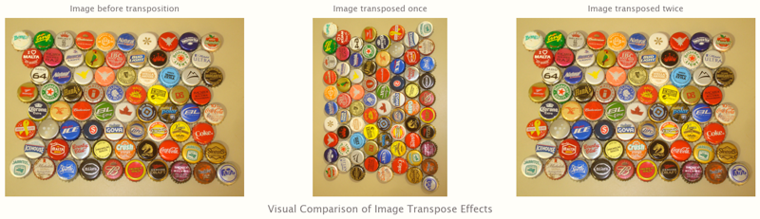

In [39]:
plt.rcParams["figure.figsize"] = (figure_size[0], figure_size[1] / 2)

fig, axs = plt.subplots(nrows=1, ncols=3)

plt.subplot(1, 3, 1)
imshow_subplot("Image before transposition", image)

plt.subplot(1, 3, 2)
# Use `cv2.transpose` to transpose the image, just like the matrix transpose

# For example, matrix A and transposed matrix B can be represented in the following way
# A = | a, b, c |, B = | a, d |
#     | d, e, f |      | b, e |
#                      | c, f |
rotated_image = cv2.transpose(image)
imshow_subplot("Image transposed once", rotated_image)

plt.subplot(1, 3, 3)
# If an already transposed image is re-transposed again, the image will eventually return to
# its original state
rotated_image_2 = cv2.transpose(rotated_image)
imshow_subplot("Image transposed twice", rotated_image_2)

fig.suptitle(
    "Visual Comparison of Image Transpose Effects",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc6_5_4_'></a>[Flips](#toc0_)


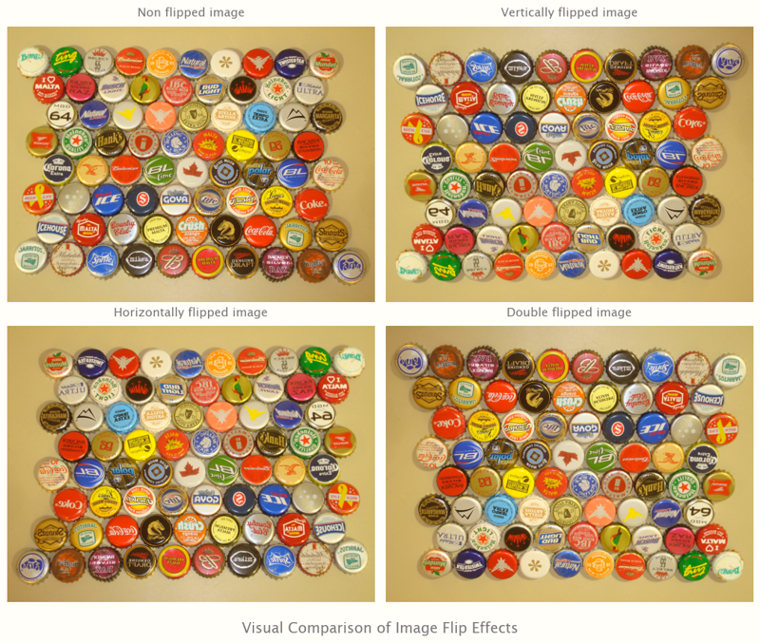

In [40]:
plt.rcParams["figure.figsize"] = (figure_size[0] / 3 * 2, figure_size[1])

fig, axs = plt.subplots(nrows=2, ncols=2)

plt.subplot(2, 2, 1)
imshow_subplot("Non flipped image", image)

plt.subplot(2, 2, 2)
# Use `cv2.flip` to flip an image around the vertical axis, the horizontal axis, or both

# When the `flipCode` value is equal to 0, it means flipping around the x-axis
flipped = cv2.flip(image, flipCode=0)
imshow_subplot("Vertically flipped image", flipped)

plt.subplot(2, 2, 3)
# When the `flipCode` value is positive (e.g. 1), it means flipping around the y-axis
flipped = cv2.flip(image, flipCode=1)
imshow_subplot("Horizontally flipped image", flipped)

plt.subplot(2, 2, 4)
# When the `flipCode` value is negative (e.g. -1), it means flipping around two axes
flipped = cv2.flip(image, flipCode=-1)
imshow_subplot("Double flipped image", flipped)

fig.suptitle(
    "Visual Comparison of Image Flip Effects",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

## <a id='toc6_6_'></a>[Scaling, Re-sizing, Interpolations and Cropping](#toc0_)

### <a id='toc6_6_1_'></a>[Scaling and Re-sizing](#toc0_)


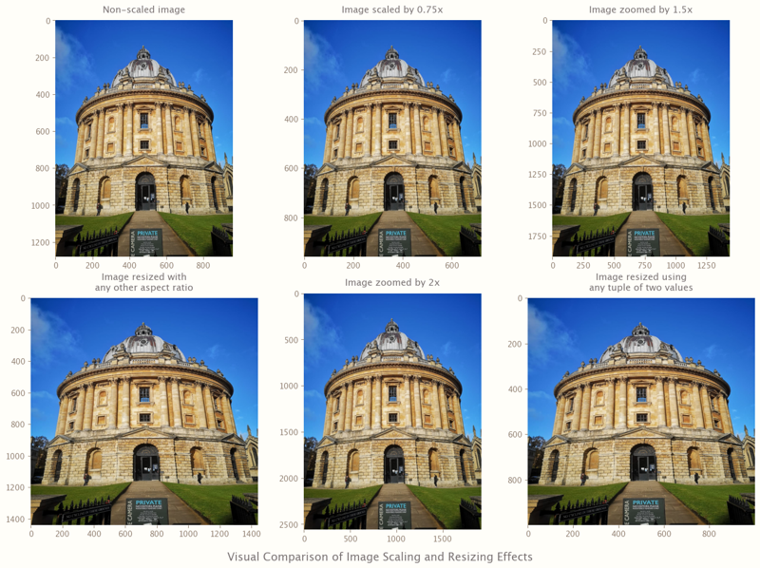

In [41]:
# Load new input image
image = cv2.imread("../images/oxfordlibrary.jpeg")

plt.rcParams["figure.figsize"] = (figure_size[0] / 7 * 6, figure_size[1] / 7 * 8)

fig, axs = plt.subplots(nrows=2, ncols=3)

plt.subplot(2, 3, 1)
imshow_subplot("Non-scaled image", image, axis="on")

plt.subplot(2, 3, 2)
# Use `cv2.resize` to scale or resize the image

# Use `dsize` or both `fx` and `fy` to set the new size of the target image

# When `fx` and `fy` are both less than 1 and the same, the image is scaled down

# If no interpolation method is specified, `cv2.INTER_LINEAR` is used as the default value for
# the parameter `interpolation`
image_scaled = cv2.resize(image, dsize=None, fx=0.75, fy=0.75)
imshow_subplot("Image scaled by 0.75x", image_scaled, axis="on")

plt.subplot(2, 3, 3)
# When `fx` and `fy` are both greater than 1 and the same, the image is scaled up
image_scaled = cv2.resize(image, dsize=None, fx=1.5, fy=1.5)
imshow_subplot("Image zoomed by 1.5x", image_scaled, axis="on")

plt.subplot(2, 3, 4)
# When `fx` and `fy` are not equal, the image no longer maintains the original ratio
# and is resized
image_scaled = cv2.resize(image, dsize=None, fx=1.5, fy=1.125)
imshow_subplot("Image resized with\nany other aspect ratio", image_scaled, axis="on")

plt.subplot(2, 3, 5)
# When `dsize` is equal to the value after scaling the length and width in the same proportion,
# it can also have the effect of scaling the image
image_scaled = cv2.resize(image, dsize=(image.shape[1] * 2, image.shape[0] * 2))
imshow_subplot("Image zoomed by 2x", image_scaled, axis="on")

plt.subplot(2, 3, 6)
# When `dsize` is any tuple of two values, the image will be resized according to that tuple
image_scaled = cv2.resize(image, dsize=(1000, 1000))
imshow_subplot("Image resized using\nany tuple of two values", image_scaled, axis="on")

fig.suptitle(
    "Visual Comparison of Image Scaling and Resizing Effects",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc6_6_2_'></a>[Interpolations](#toc0_)


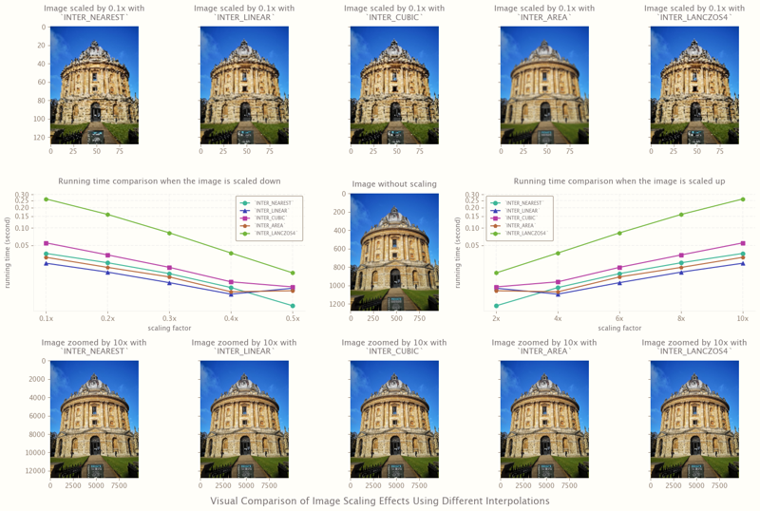

In [42]:
def forward(x):
    return x ** (1 / 5)


def inverse(x):
    return x**5


colors = itertools.cycle(calm_color_generator(5))

# Reference: https://chadrick-kwag.net/cv2-resize-interpolation-methods

# `cv2.INTER_NEAREST` is a nearest-neighbor interpolation

# `cv2.INTER_LINEAR` is a bilinear interpolation (used by default)

# `cv2.INTER_AREA` means resampling using pixel area relation, which may be a preferred method
# for image decimation, as it gives moire-free results

# But when the image is zoomed, `cv2.INTER_AREA` is similar to the `cv2.INTER_NEAREST` method

# `cv2.INTER_CUBIC` is a bicubic interpolation over 4 × 4 pixel neighborhood

# `cv2.INTER_LANCZOS4` is a Lanczos interpolation over 8 × 8 pixel neighborhood
interpolation_dict = {
    cv2.INTER_NEAREST: "INTER NEAREST",
    cv2.INTER_LINEAR: "INTER LINEAR",
    cv2.INTER_CUBIC: "INTER CUBIC",
    cv2.INTER_AREA: "INTER AREA",
    cv2.INTER_LANCZOS4: "INTER LANCZOS4",
}

markers = itertools.cycle(["o", "^", "s", "p", "h"])

plt.rcParams["figure.figsize"] = (figure_size[0], figure_size[1] / 5 * 6)

fig, axs = plt.subplots(nrows=3, ncols=5, sharey="row")

gridspec = axs[0, 0].get_gridspec()

for i in range(3):
    scale_down = scale_up = {}
    for j, key, value in zip(
        range(5), interpolation_dict.keys(), interpolation_dict.values()
    ):
        plt.subplot(3, 5, i * 5 + j + 1)
        if i == 0:
            exec(f"inter_{value.split()[-1].lower()}_down = []")
            for k in range(5, 0, -1):
                start = time.time()
                image_scaled = cv2.resize(
                    image, None, fx=0.1 * k, fy=0.1 * k, interpolation=key
                )
                end = time.time()
                exec(f"inter_{value.split()[-1].lower()}_down.append({end - start})")
            exec(
                f"scale_down.update([(value, inter_{value.split()[-1].lower()}_down)])"
            )
            imshow_subplot(
                f'Image scaled by 0.1x with\n`{value.replace(" ", "_")}`',
                image_scaled,
                axis="on",
            )
        elif i == 2:
            exec(f"inter_{value.split()[-1].lower()}_up = []")
            for k in range(1, 6):
                start = time.time()
                image_scaled = cv2.resize(
                    image, None, fx=2 * k, fy=2 * k, interpolation=key
                )
                end = time.time()
                exec(f"inter_{value.split()[-1].lower()}_up.append({end - start})")
            exec(f"scale_up.update([(value, inter_{value.split()[-1].lower()}_up)])")
            imshow_subplot(
                f'Image zoomed by 10x with\n`{value.replace(" ", "_")}`',
                image_scaled,
                axis="on",
            )

for ax in axs[1, :]:
    ax.remove()

central_subplot = fig.add_subplot(gridspec[1, 2])
imshow_subplot("Image without scaling", image, axis="on")

left_subplot = fig.add_subplot(gridspec[1, :2])
left_subplot.set_yscale("function", functions=(forward, inverse))
x_ticks = ["%.1f" % (0.1 * k) for k in range(1, 6)]
for key, value in scale_down.items():
    left_subplot.plot(
        x_ticks,
        value[::-1],
        label=f'`{key.replace(" ", "_")}`',
        c=next(colors),
        marker=next(markers),
    )
    left_subplot.legend(loc="upper right", fontsize="x-small", borderpad=1, ncol=1)
left_subplot.set_xticks(ticks=x_ticks, labels=[f"{x}x" for x in x_ticks])
left_subplot.set(xlabel="scaling factor", ylabel="running time (second)")
left_subplot.set_title(
    "Running time comparison when the image is scaled down", loc="center", pad=15
)

right_subplot = fig.add_subplot(gridspec[1, 3:])
right_subplot.set_yscale("function", functions=(forward, inverse))
x_ticks = [2 * k for k in range(1, 6)]
for key, value in scale_up.items():
    right_subplot.plot(
        x_ticks,
        value,
        label=f'`{key.replace(" ", "_")}`',
        c=next(colors),
        marker=next(markers),
    )
    right_subplot.legend(loc="upper left", fontsize="x-small", borderpad=1, ncol=1)
right_subplot.set_xticks(ticks=x_ticks, labels=[f"{x}x" for x in x_ticks])
right_subplot.set(xlabel="scaling factor", ylabel="running time (second)")
right_subplot.set_title(
    "Running time comparison when the image is scaled up", loc="center", pad=15
)

fig.suptitle(
    "Visual Comparison of Image Scaling Effects Using Different Interpolations",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc6_6_3_'></a>[Image Pyramids](#toc0_)


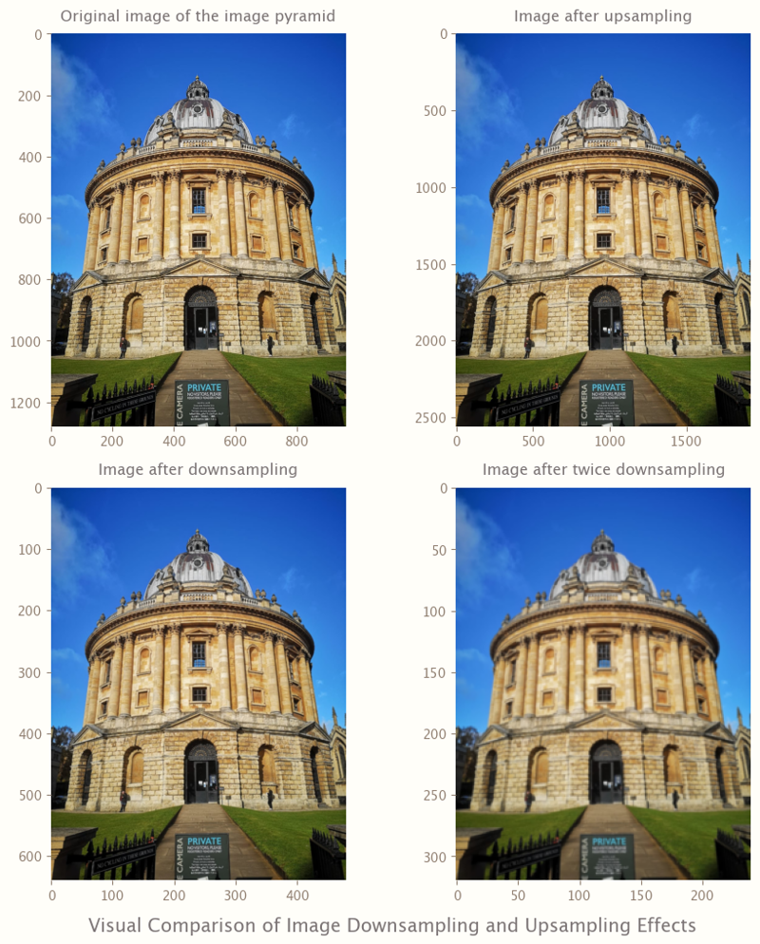

In [43]:
plt.rcParams["figure.figsize"] = (figure_size[0] / 7 * 4, figure_size[1] / 7 * 8)

fig, axs = plt.subplots(nrows=2, ncols=2)

plt.subplot(2, 2, 1)
imshow_subplot("Original image of the image pyramid", image, axis="on")

plt.subplot(2, 2, 2)
# An image pyramid is a collection of successively downsampled images, all from
# a single original image, until some desired stopping point is reached

# There are two common types of image pyramids, Gaussian Pyramid and Laplacian Pyramid,
# the first for downsampling images, and the second for reconstructing an upsampled image
# from an image lower in the pyramid
larger = cv2.pyrUp(image)
imshow_subplot("Image after upsampling", larger, axis="on")

plt.subplot(2, 2, 3)
smaller = cv2.pyrDown(image)
imshow_subplot("Image after downsampling", smaller, axis="on")

plt.subplot(2, 2, 4)
even_smaller = cv2.pyrDown(smaller)
imshow_subplot("Image after twice downsampling", even_smaller, axis="on")

fig.suptitle(
    "Visual Comparison of Image Downsampling and Upsampling Effects",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc6_6_4_'></a>[Cropping](#toc0_)


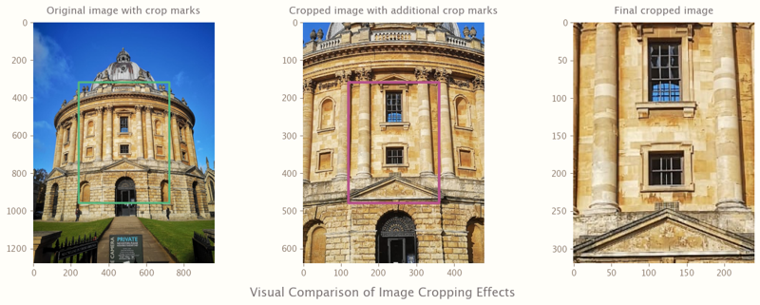

In [44]:
colors = calm_color_generator(2)

# Get image dimensions
height, width = image.shape[:2]

# Set the starting pixel coordinates, that is, the upper-left corner of the clipping rectangle
start_row, start_col = int(height * 0.25), int(width * 0.25)

# Set the end pixel coordinates, i.e., the bottom right corner of the clipping rectangle
end_row, end_col = int(height * 0.75), int(width * 0.75)

plt.rcParams["figure.figsize"] = (figure_size[0] / 7 * 6, figure_size[1] / 7 * 4)

fig, axs = plt.subplots(nrows=1, ncols=3)

plt.subplot(1, 3, 1)
copy = image.copy()
# Use the `cv2.rectangle` function to draw a rectangle on the image, which is an
# in-place operation
cv2.rectangle(
    copy, (start_col, start_row), (end_col, end_row), hex_to_rgb(colors.pop(0)), 10
)
imshow_subplot("Original image with crop marks", copy, axis="on")

plt.subplot(1, 3, 2)
# Simply use the index to crop out the desired rectangle
cropped = image[start_row:end_row, start_col:end_col]

height, width = cropped.shape[:2]
start_row, start_col = int(height * 0.25), int(width * 0.25)
end_row, end_col = int(height * 0.75), int(width * 0.75)

copy = cropped.copy()
cv2.rectangle(
    copy, (start_col, start_row), (end_col, end_row), hex_to_rgb(colors.pop(0)), 5
)
imshow_subplot("Cropped image with additional crop marks", copy, axis="on")

plt.subplot(1, 3, 3)
cropped = cropped[start_row:end_row, start_col:end_col]
imshow_subplot("Final cropped image", cropped, axis="on")

fig.suptitle(
    "Visual Comparison of Image Cropping Effects",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

## <a id='toc6_7_'></a>[Arithmetic and Bitwise Operations](#toc0_)

### <a id='toc6_7_1_'></a>[Arithmetic Operations](#toc0_)


In [45]:
# Add a zero after the comma in `cv2.imread` to load the image as a grayscale image
image = cv2.imread("../Images/liberty.jpeg", 0)

# Create a matrix with the same dimensions as the image, then multiply by a scale of 100
M = np.ones(image.shape, dtype="uint8") * 100

tabulation = Form_Generator()
tabulation.heading_printer("Preparation for arithmetic operations")

statements = [
    """
image = cv2.imread("../Images/liberty.jpeg", 0)

M = np.ones(image.shape, dtype="uint8") * 100
"""
]
tabulation.statement_generator(statements)

variables = ["image", "M"]
values = [str(reprlib_rules.repr(image)), str(reprlib_rules.repr(M))]
tabulation.variable_generator(variables, values)

expressions = ["image.shape", "M.shape"]
results = [str(image.shape), str(M.shape)]
tabulation.expression_generator(expressions, results)

Preparation for arithmetic operations

    +-------------------------------------------------+
    | Statement                                       |
    +-------------------------------------------------+
    | image = cv2.imread("../Images/liberty.jpeg", 0) |
    |                                                 |
    | M = np.ones(image.shape, dtype="uint8") * 100   |
    +-------------------------------------------------+
    +----------+------------------------------------------------+
    | Variable | Value                                          |
    +----------+------------------------------------------------+
    | image    | array([[41, 41, 41, ...,  5,  5,  5],          |
    |          |        [41, 41, 41, ...,  5,  5,  5],          |
    |          |        [41, 41, 41, ...,  5,  5,  5],          |
    |          |        .....    [41, 42, 44, ..., 34, 33, 32], |
    |          |        [43, 44, 46, ..., 31, 30, 28],          |
    |          |        [44, 45, 46, ...,

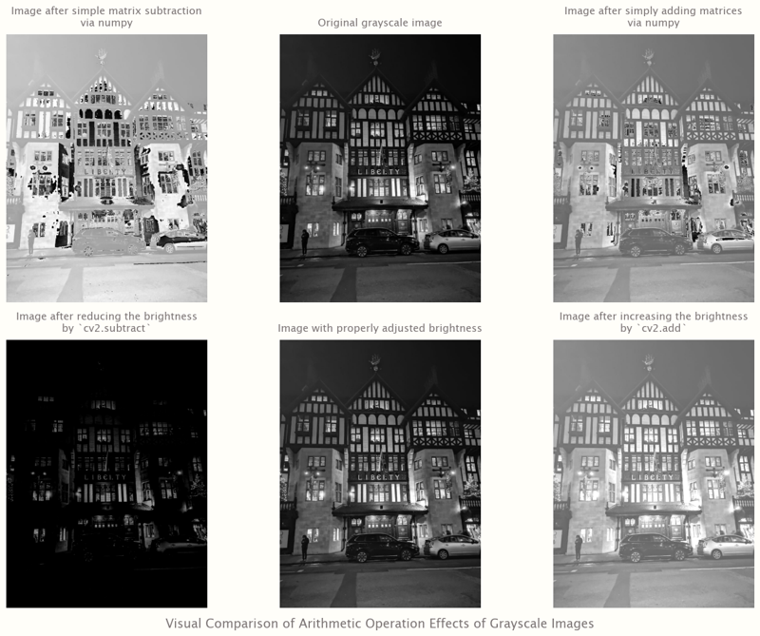

In [46]:
plt.rcParams["figure.figsize"] = (figure_size[0] / 7 * 6, figure_size[1] / 7 * 8)

fig, axs = plt.subplots(nrows=2, ncols=3)

plt.subplot(2, 3, 1)
# There are two ways to subtract matrix M, but the final effect may be different
subtracted = image - M
imshow_subplot("Image after simple matrix subtraction\nvia numpy", subtracted)

plt.subplot(2, 3, 2)
imshow_subplot("Original grayscale image", image)

plt.subplot(2, 3, 3)
# There are also two ways to add matrix M, but the final effect may be different
added = image + M
imshow_subplot("Image after simply adding matrices\nvia numpy", added)

plt.subplot(2, 3, 4)
subtracted = cv2.subtract(image, M)
imshow_subplot("Image after reducing the brightness\nby `cv2.subtract`", subtracted)

plt.subplot(2, 3, 5)
new_image = cv2.add(image, np.multiply(M, 0.1).astype("uint8"))
imshow_subplot("Image with properly adjusted brightness", new_image)

plt.subplot(2, 3, 6)
added = cv2.add(image, M)
imshow_subplot("Image after increasing the brightness\nby `cv2.add`", added)


fig.suptitle(
    "Visual Comparison of Arithmetic Operation Effects of Grayscale Images",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

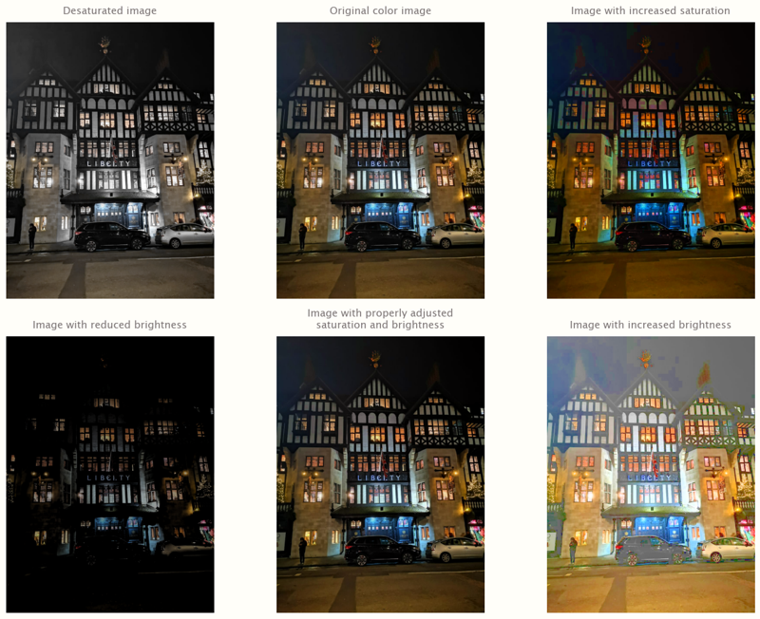

In [47]:
# Reload the same image as the color image
image = cv2.imread("../Images/liberty.jpeg")

hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
H, S, V = cv2.split(hsv_image)

plt.rcParams["figure.figsize"] = (figure_size[0] / 7 * 6, figure_size[1] / 7 * 8)

fig, axs = plt.subplots(nrows=2, ncols=3)

plt.subplot(2, 3, 1)
merged = cv2.merge([H, cv2.subtract(S, M), V])
imshow_subplot(
    "Desaturated image",
    cv2.cvtColor(merged, cv2.COLOR_HSV2RGB),
    conversion=None,
)

plt.subplot(2, 3, 2)
imshow_subplot(
    "Original color image",
    cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB),
    conversion=None,
)

plt.subplot(2, 3, 3)
merged = cv2.merge([H, cv2.add(S, M), V])
imshow_subplot(
    "Image with increased saturation",
    cv2.cvtColor(merged, cv2.COLOR_HSV2RGB),
    conversion=None,
)

plt.subplot(2, 3, 4)
merged = cv2.merge([H, S, cv2.subtract(V, M)])
imshow_subplot(
    "Image with reduced brightness",
    cv2.cvtColor(merged, cv2.COLOR_HSV2RGB),
    conversion=None,
)

plt.subplot(2, 3, 5)
new_image = cv2.merge(
    [
        H,
        cv2.add(S, np.multiply(M, 0.15).astype("uint8")),
        cv2.subtract(V, np.multiply(M, 0.05).astype("uint8")),
    ]
)
imshow_subplot(
    "Image with properly adjusted\nsaturation and brightness",
    cv2.cvtColor(new_image, cv2.COLOR_HSV2RGB),
    conversion=None,
)

plt.subplot(2, 3, 6)
merged = cv2.merge([H, S, cv2.add(V, M)])
imshow_subplot(
    "Image with increased brightness",
    cv2.cvtColor(merged, cv2.COLOR_HSV2RGB),
    conversion=None,
)

fig.suptitle(
    "",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc6_7_2_'></a>[Bitwise Operations and Masking](#toc0_)


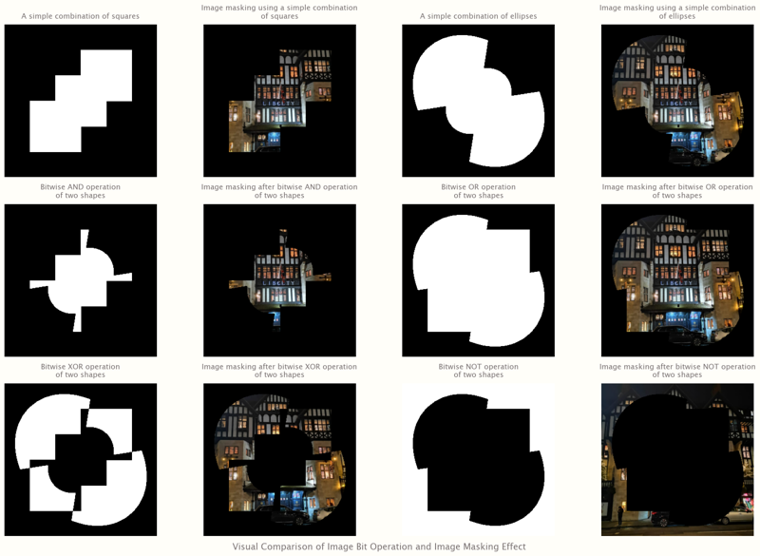

In [48]:
plt.rcParams["figure.figsize"] = (figure_size[0] / 7 * 8, figure_size[1] / 5 * 7)

fig, axs = plt.subplots(nrows=3, ncols=4)
# Crop the image and adjust it to the desired size
height, weight = image.shape[:2]
adjusted_image = image[(height - weight) // 2 : (height + weight) // 2, :]
adjusted_image = cv2.resize(
    adjusted_image, dsize=(300, 300), interpolation=cv2.INTER_AREA
)

plt.subplot(3, 4, 1)
square = np.zeros((300, 300), np.uint8)
# Create several squares on a black canvas using `cv2.rectangle`
cv2.rectangle(square, (150, 50), (250, 150), 255, -1)
cv2.rectangle(square, (50, 150), (150, 250), 255, -1)
cv2.rectangle(square, (100, 100), (200, 200), 255, -1)
imshow_subplot("A simple combination of squares", square)

plt.subplot(3, 4, 2)
# Only show the masked part in the resized and cropped image

# Mask is an 8-bit single-channel array

# The final output array is composed of the image elements corresponding to the coordinates of
# the non-zero elements of the mask, that is, the image content corresponding to the
# non-black part of the mask
masked_image = cv2.bitwise_and(adjusted_image, adjusted_image, mask=square)
imshow_subplot("Image masking using a simple combination\nof squares", masked_image)

plt.subplot(3, 4, 3)
ellipse = np.zeros((300, 300), np.uint8)
# Use `cv2.ellipse` to create some ellipses or sectors on a black canvas
cv2.ellipse(ellipse, (150, 150), (144, 112), 45, -60, 60, 255, -1)
cv2.ellipse(ellipse, (150, 150), (144, 112), 45, 120, 240, 255, -1)
cv2.ellipse(ellipse, (150, 150), (72, 56), -45, 0, 360, 255, -1)
imshow_subplot("A simple combination of ellipses", ellipse)

plt.subplot(3, 4, 4)
masked_image = cv2.bitwise_and(adjusted_image, adjusted_image, mask=ellipse)
imshow_subplot("Image masking using a simple combination\nof ellipses", masked_image)

plt.subplot(3, 4, 5)
# Show only the intersection of two shapes
bitwiseAnd = cv2.bitwise_and(square, ellipse)
imshow_subplot("Bitwise AND operation\nof two shapes", bitwiseAnd)

plt.subplot(3, 4, 6)
masked_image = cv2.bitwise_and(adjusted_image, adjusted_image, mask=bitwiseAnd)
imshow_subplot("Image masking after bitwise AND operation\nof two shapes", masked_image)

plt.subplot(3, 4, 7)
# Show the union of two shapes
bitwiseOr = cv2.bitwise_or(square, ellipse)
imshow_subplot("Bitwise OR operation\nof two shapes", bitwiseOr)

plt.subplot(3, 4, 8)
masked_image = cv2.bitwise_and(adjusted_image, adjusted_image, mask=bitwiseOr)
imshow_subplot("Image masking after bitwise OR operation\nof two shapes", masked_image)

plt.subplot(3, 4, 9)
# Show that either of the two shapes exists alone
bitwiseXor = cv2.bitwise_xor(square, ellipse)
imshow_subplot("Bitwise XOR operation\nof two shapes", bitwiseXor)

plt.subplot(3, 4, 10)
masked_image = cv2.bitwise_and(adjusted_image, adjusted_image, mask=bitwiseXor)
imshow_subplot("Image masking after bitwise XOR operation\nof two shapes", masked_image)

plt.subplot(3, 4, 11)
# Show everything that is not part of these two shapes
bitwiseNot = cv2.bitwise_not(cv2.bitwise_or(square, ellipse))
imshow_subplot("Bitwise NOT operation\nof two shapes", bitwiseNot)

plt.subplot(3, 4, 12)
masked_image = cv2.bitwise_and(adjusted_image, adjusted_image, mask=bitwiseNot)
imshow_subplot("Image masking after bitwise NOT operation\nof two shapes", masked_image)

fig.suptitle(
    "Visual Comparison of Image Bit Operation and Image Masking Effect",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

## <a id='toc6_8_'></a>[Convolutions, Blurring and Sharpening Images](#toc0_)

### <a id='toc6_8_1_'></a>[Blurring Using Convolutions](#toc0_)


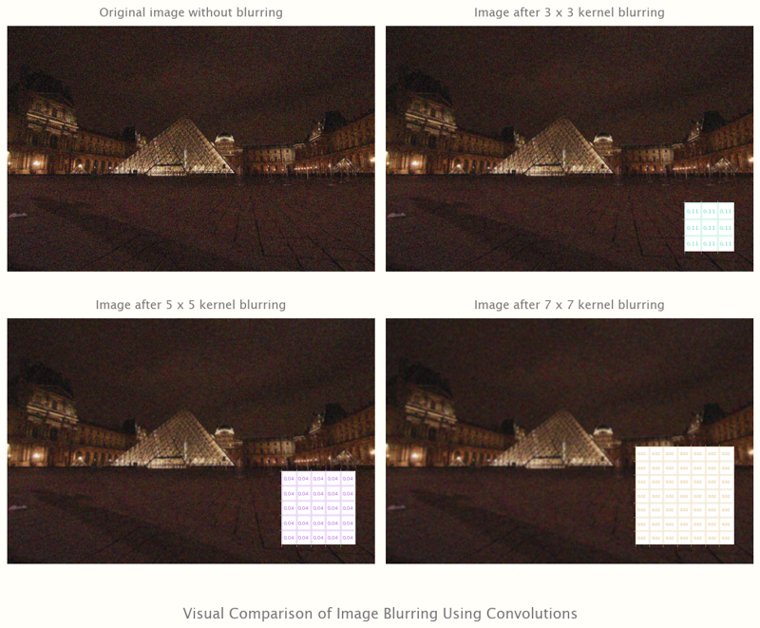

In [49]:
def display_matrix(ax, matrix, color, fontsize="xx-small"):
    ax.matshow(matrix, cmap="binary")
    textcolors = gradient_light_generator(color, 3)
    for i, j in itertools.product(range(matrix.shape[0]), range(matrix.shape[1])):
        text = matrix[j, i]
        index = int(text >= 1)
        ax.text(
            i,
            j,
            str(text),
            va="center",
            ha="center",
            color=textcolors[index],
            fontsize=fontsize,
        )
    ax.grid(which="minor", color=textcolors[-1], linestyle="-", linewidth=2)
    ax.set_xticks(np.arange(-0.5, matrix.shape[0] - 0.5, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, matrix.shape[1] - 0.5, 1), minor=True)
    ax.set(xticks=[], yticks=[], xticklabels=[], yticklabels=[], frame_on=False)


colors = calm_color_generator(3)

# Load an image with noise
image = cv2.imread("../Images/lourve_noise.jpg")


plt.rcParams["figure.figsize"] = (figure_size[0] / 3 * 2, figure_size[1])

fig, axs = plt.subplots(nrows=2, ncols=2)

plt.subplot(2, 2, 1)
imshow_subplot("Original image without blurring", image)

plt.subplot(2, 2, 2)
# create a 3 x 3 box blur kernel
kernel_3x3 = np.ones((3, 3), np.float32) / 9

# Convolve the kernel with the image using `cv2.fitler2D`
blurred = cv2.filter2D(image, -1, kernel_3x3)
imshow_subplot("Image after 3 x 3 kernel blurring", blurred)

plt.subplot(2, 2, 3)
# create a 5 x 5 box blur kernel
kernel_5x5 = np.ones((5, 5), np.float32) / 25
blurred = cv2.filter2D(image, -1, kernel_5x5)
imshow_subplot("Image after 5 x 5 kernel blurring", blurred)

plt.subplot(2, 2, 4)
# create a 7 x 7 box blur kernel
kernel_7x7 = np.ones((7, 7), np.float32) / 49
blurred = cv2.filter2D(image, -1, kernel_7x7)
imshow_subplot("Image after 7 x 7 kernel blurring", blurred)

for ax, k in zip(axs.flat[1:], range(3)):
    exec(
        f"axins_{k} = ax.inset_axes([.78 - .084 * k, .08 - .0012 * k, .2 + .1 * k, .2 + .1 * k])"
    )

axins_0 = display_matrix(axins_0, np.around(kernel_3x3, 2), colors.pop(0))
axins_1 = display_matrix(axins_1, np.around(kernel_5x5, 2), colors.pop(0), fontsize=5)
axins_2 = display_matrix(axins_2, np.around(kernel_7x7, 2), colors.pop(0), fontsize=4)

fig.suptitle(
    "Visual Comparison of Image Blurring Using Convolutions",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc6_8_2_'></a>[Other Commonly Used Blurring Methods in OpenCV](#toc0_)


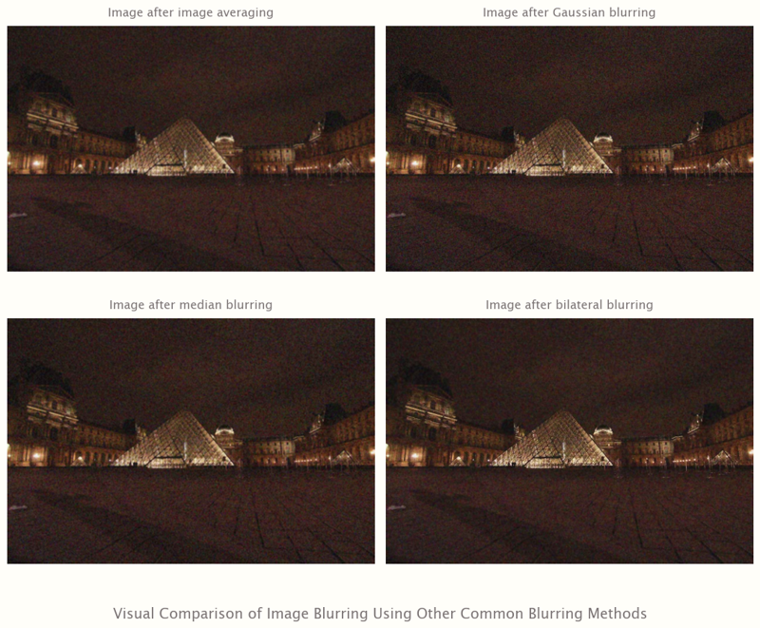

In [50]:
plt.rcParams["figure.figsize"] = (figure_size[0] / 3 * 2, figure_size[1])

fig, axs = plt.subplots(nrows=2, ncols=2)

plt.subplot(2, 2, 1)
# Use `cv2.blur` to blur an image by convolving it with a normalization box filter

# This normalized box filter simply takes the average of all pixels under the kernel area
# and replaces the center element

# Need to specify the width and height of the kernel
blur = cv2.blur(image, (5, 5))
imshow_subplot("Image after image averaging", blur)

plt.subplot(2, 2, 2)
# In Gaussian blur, a Gaussian kernel is used instead of a box filter

# The width and height of the kernel need to be specified and should be positive and odd

# Gaussian Blur is very effective in removing Gaussian noise from images
Gaussian = cv2.GaussianBlur(image, (5, 5), sigmaX=0)
imshow_subplot("Image after Gaussian blurring", Gaussian)

plt.subplot(2, 2, 3)
# Use `cv2.medianBlur` to take the median of all pixels under the kernel area and replace
# the center element with the median

# Median blur is very effective for salt and pepper noise in images

# Aperture linear size needs to be specified, and should be odd and greater than 1
median = cv2.medianBlur(image, 5)
imshow_subplot("Image after median blurring", median)

plt.subplot(2, 2, 4)
# `cv2.bilateralFilter` is very effective at removing noise while keeping edges sharp,
# although it operates slower compared to other filters

# A Gaussian filter takes the neighborhood around a pixel and takes its Gaussian-weighted average,
# but doesn't take into account whether the pixels have nearly the same intensity

# In other words, the Gaussian filter does not consider whether the pixel is an edge pixel or not

# Bilateral filtering also uses a Gaussian filter in space, but one more Gaussian filter
# as a function of pixel difference can preserve the edge, because the pixels at the edge
# will have a large intensity variation

# For real-time applications, `d` is recommended to be set to 5, and for offline applications
# that require a lot of noise filtering, perhaps `d` is recommended to be set to 9
bilateral = cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)
imshow_subplot("Image after bilateral blurring", bilateral)

fig.suptitle(
    "Visual Comparison of Image Blurring Using Other Common Blurring Methods",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc6_8_3_'></a>[Image Denoising - Non-Local Means Denoising](#toc0_)


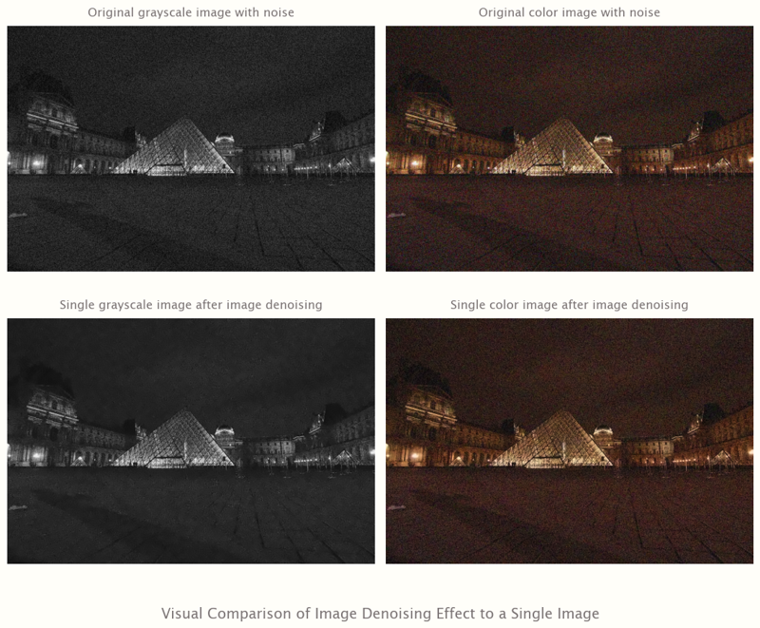

In [51]:
# Load an image with noise as a grayscale image
image_gray = cv2.imread("../Images/lourve_noise.jpg", 0)

plt.rcParams["figure.figsize"] = (figure_size[0] / 3 * 2, figure_size[1])

fig, axs = plt.subplots(nrows=2, ncols=2)

plt.subplot(2, 2, 1)
imshow_subplot("Original grayscale image with noise", image_gray)

plt.subplot(2, 2, 2)
imshow_subplot("Original color image with noise", image)

plt.subplot(2, 2, 3)
# The Non-Local Means Denoising method provided by OpenCV has four variant techniques

# Of the four variants, two are for single images and the other two are for sequences captured
# over a short period of time

# Among them, `cv2.fastNlMeansDenoising` and `cv2.fastNlMeansDenoisingColored` are suitable
# for single images

# The difference is that the former is suitable for processing grayscale images, and the latter
# is suitable for processing color images

# `h` is a parameter to regulate the filter strength for the luminance component, the larger
# the value, the noise can be perfectly removed but the image details are also removed,
# and vice versa

# `templateWindowSize` indicates the size of the template patch used to calculate the weight,
# in pixels, should be an odd number, the recommended value is 7 pixels

# `searchWindowSize` indicates the window size in pixels used to calculate the weighted average
# of the given pixels, it should be an odd number, the recommended value is 21 pixels

# `searchWindowSize` has a linear impact on performance, meaning larger values take longer
# to denoise
dst = cv2.fastNlMeansDenoising(
    image_gray, None, h=10, templateWindowSize=7, searchWindowSize=21
)
imshow_subplot("Single grayscale image after image denoising", dst)

plt.subplot(2, 2, 4)
# `hColor` is the same as `h`, but only for color components, a value equal to 10 is sufficient
# to remove color noise without distorting the color of most images
dst = cv2.fastNlMeansDenoisingColored(
    image, None, h=10, hColor=10, templateWindowSize=7, searchWindowSize=21
)
imshow_subplot("Single color image after image denoising", dst)

fig.suptitle(
    "Visual Comparison of Image Denoising Effect to a Single Image",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()

### <a id='toc6_8_4_'></a>[Image Sharpening](#toc0_)


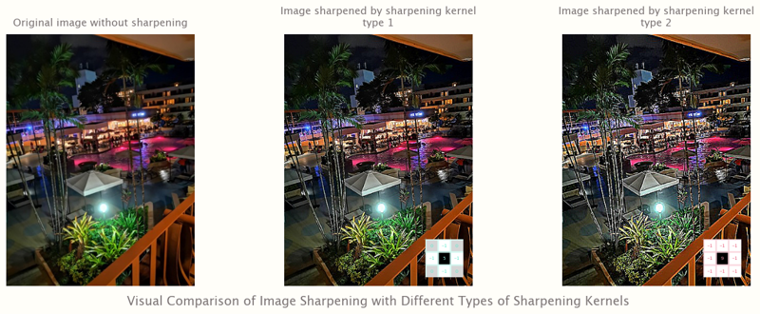

In [52]:
colors = calm_color_generator(2)

# Load an image with noise
image = cv2.imread("../Images/hilton.jpeg")

plt.rcParams["figure.figsize"] = (figure_size[0] / 7 * 6, figure_size[1] / 7 * 4)

fig, axs = plt.subplots(nrows=1, ncols=3)

plt.subplot(1, 3, 1)
imshow_subplot("Original image without sharpening", image)

plt.subplot(1, 3, 2)
# Create the sharpening kernel, remember, it must sum to one
sharpening_kernel_1 = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

# Apply the sharpening kernel type 1 to the image
sharpened = cv2.filter2D(image, -1, sharpening_kernel_1)
imshow_subplot("Image sharpened by sharpening kernel\ntype 1", sharpened)

plt.subplot(1, 3, 3)
sharpening_kernel_2 = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])

# Apply the sharpening kernel type 2 to the image
sharpened = cv2.filter2D(image, -1, sharpening_kernel_2)
imshow_subplot("Image sharpened by sharpening kernel\ntype 2", sharpened)

for ax, k in zip(axs.flat[1:], range(3)):
    exec(f"axins_{k} = ax.inset_axes([.75, .01, .2, .2])")

axins_0 = display_matrix(axins_0, sharpening_kernel_1, colors.pop(0))
axins_1 = display_matrix(axins_1, sharpening_kernel_2, colors.pop(0))

fig.suptitle(
    "Visual Comparison of Image Sharpening with Different Types of Sharpening Kernels",
    fontsize="x-large",
    x=0.5,
    y=0,
)

plt.tight_layout()
plt.show()